<a href="https://colab.research.google.com/github/shreyansh4532/EDI_VII/blob/main/Colorize.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
#Importing Libraries

from tensorflow.keras.utils import  array_to_img, img_to_array, load_img
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from skimage.color import rgb2lab, lab2rgb, rgb2gray
from skimage.io import imsave
import numpy as np
import os
import random
import tensorflow as tf

In [4]:
X = []
train_path = '/content/drive/My Drive/col_Dataset/Train/'
for imagename in os.listdir(train_path):
    X.append(img_to_array(load_img(train_path + imagename, target_size=(256, 256))))
print(f"Loaded {len(X)} images.")
X = np.array(X, dtype=float)

Loaded 840 images.


In [5]:
# For Checking purpose
print(f"Loaded {len(X)} images.")

Loaded 840 images.


In [6]:
# Set up train and test data
split = int(0.95*len(X))
Xtrain = X[:split]
Xtrain = 1.0/255*Xtrain

#set up Test data
Xtest = X[split:]
Xtest = 1.0/255*Xtest


In [7]:
#CNN model
from keras.layers import Conv2D, Conv2DTranspose, UpSampling2D
from keras.layers import Activation, Dense, Dropout, Flatten, InputLayer
from tensorflow.keras.layers import BatchNormalization
from keras.callbacks import TensorBoard, ModelCheckpoint, ReduceLROnPlateau
from keras.models import Sequential
from keras.optimizers import Adam

model = Sequential()

#Input Layer
model.add(Conv2D(64, (3, 3), input_shape=(256, 256, 1), activation='relu', padding='same'))
model.add(BatchNormalization())

#Hidden Layers
model.add(Conv2D(64, (3, 3), activation='relu', padding='same', strides=2))
model.add(BatchNormalization())
model.add(Dropout(0.2))  # Dropout to prevent overfitting

model.add(Conv2D(128, (3, 3), activation='relu', padding='same'))
model.add(BatchNormalization())
model.add(Dropout(0.3))  # Slightly higher dropout for deeper layers

model.add(Conv2D(128, (3, 3), activation='relu', padding='same', strides=2))
model.add(BatchNormalization())

model.add(Conv2D(256, (3, 3), activation='relu', padding='same'))
model.add(BatchNormalization())

model.add(Conv2D(256, (3, 3), activation='relu', padding='same', strides=2))
model.add(BatchNormalization())

model.add(Conv2D(512, (3, 3), activation='relu', padding='same'))
model.add(BatchNormalization())

model.add(Conv2D(256, (3, 3), activation='relu', padding='same'))
model.add(BatchNormalization())

model.add(Conv2D(128, (3, 3), activation='relu', padding='same'))
model.add(BatchNormalization())
model.add(UpSampling2D((2, 2)))

model.add(Conv2D(64, (3, 3), activation='relu', padding='same'))
model.add(BatchNormalization())
model.add(UpSampling2D((2, 2)))

model.add(Conv2D(32, (3, 3), activation='relu', padding='same'))
model.add(BatchNormalization())

model.add(Conv2D(2, (3, 3), activation='tanh', padding='same'))
model.add(UpSampling2D((2, 2)))

#Compiling the CNN
optimizer = Adam(learning_rate=1e-4)
model.compile(optimizer=optimizer, loss='mse', metrics = ['accuracy'])
import matplotlib.pyplot as plt

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [8]:
# Image transformer
datagen = ImageDataGenerator(
        shear_range=0.2,
        zoom_range=0.2,
        rotation_range=20,
        horizontal_flip=True)

In [9]:
# Generate training data
batch_size = 10
def image_a_b_gen(batch_size):
    for batch in datagen.flow(Xtrain, batch_size=batch_size):
        lab_batch = rgb2lab(batch)
        X_batch = lab_batch[:,:,:,0]
        Y_batch = lab_batch[:,:,:,1:] / 128
        yield (X_batch.reshape(X_batch.shape+(1,)), Y_batch)

In [10]:
# Train model
tensorboard = TensorBoard(log_dir="/output/beta_run")
checkpoint = ModelCheckpoint("best_model.keras", monitor='loss', verbose=1, save_best_only=True, mode='min')
reduce_lr = ReduceLROnPlateau(monitor='loss', factor=0.5, patience=10, min_lr=1e-6, verbose=1)
trainedmodel = model.fit(image_a_b_gen(batch_size), callbacks=[tensorboard, checkpoint, reduce_lr],epochs=300, steps_per_epoch=30)

Epoch 1/300
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step - accuracy: 0.5101 - loss: 0.3222
Epoch 1: loss improved from inf to 0.19481, saving model to best_model.keras
30/30 ━━━━━━━━━━━━━━━━━━━━ 48s 288ms/step - accuracy: 0.5100 - loss: 0.3181 - learning_rate: 1.0000e-04
Epoch 2/300
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 217ms/step - accuracy: 0.5046 - loss: 0.0265
Epoch 2: loss improved from 0.19481 to 0.02335, saving model to best_model.keras
30/30 ━━━━━━━━━━━━━━━━━━━━ 7s 233ms/step - accuracy: 0.5047 - loss: 0.0264 - learning_rate: 1.0000e-04
Epoch 3/300
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1s/step - accuracy: 0.5061 - loss: 0.0181
Epoch 3: loss improved from 0.02335 to 0.01662, saving model to best_model.keras
30/30 ━━━━━━━━━━━━━━━━━━━━ 33s 1s/step - accuracy: 0.5063 - loss: 0.0181 - learning_rate: 1.0000e-04
Epoch 4/300
30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step - accuracy: 0.5163 - loss: 0.0157
Epoch 4: loss improved from 0.01662 to 0.01415, saving model to best_model.keras
30/30 ━━━━━━━━━━━━━━━━━━━━ 

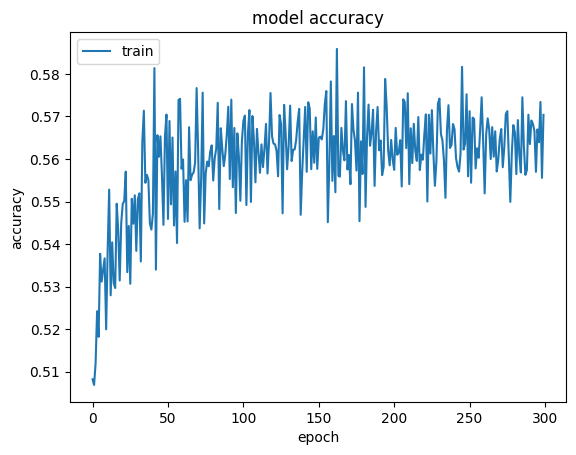

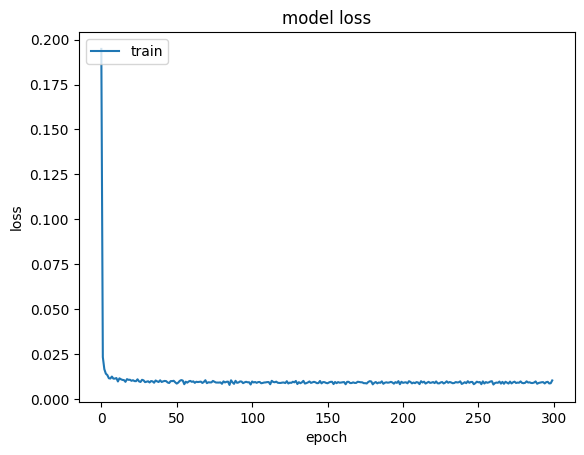

In [11]:
# Summarize history for model accuracy
plt.plot(trainedmodel.history['accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

# Summarize history for model loss
plt.plot(trainedmodel.history['loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

In [12]:
# Save model
model_json = model.to_json()
with open("model.json", "w") as json_file:
    json_file.write(model_json)
model.save_weights("model.weights.h5")

# load json and create model
from keras.models import model_from_json
json_file = open('model.json', 'r')
loaded_model_json = json_file.read()
json_file.close()
loaded_model = model_from_json(loaded_model_json)
# load weights into new model
loaded_model.load_weights("model.weights.h5")
loaded_model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 256, 256, 64)        │             640 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 256, 256, 64)        │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 128, 128, 64)        │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 128, 128, 64)        │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 128, 128, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 128, 128, 128)       │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 128, 128, 128)       │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 128, 128, 128)       │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 64, 64, 128)         │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_3                │ (None, 64, 64, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_4 (Conv2D)                    │ (None, 64, 64, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_4                │ (None, 64, 64, 256)         │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_5 (Conv2D)                    │ (None, 32, 32, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_5                │ (None, 32, 32, 256)         │           1,024 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_6 (Conv2D)                    │ (None, 32, 32, 512)         │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_6                │ (None, 32, 32, 512)         │           2,048 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_7 (Conv2D)                    │ (None, 32, 32, 256)         │       1,179,904 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_7                │ (None, 32, 32, 256)         │           1,0

 Total params: 11,691,688 (44.60 MB)

 Trainable params: 3,895,970 (14.86 MB)

 Non-trainable params: 3,776 (14.75 KB)

 Optimizer params: 7,791,942 (29.72 MB)

In [13]:
# Test images
loaded_model.compile(optimizer=optimizer, loss='mse', metrics = ['accuracy'])
Xtest = rgb2lab(1.0/255*X[split:])[:,:,:,0]
Xtest = Xtest.reshape(Xtest.shape+(1,))
Ytest = rgb2lab(1.0/255*X[split:])[:,:,:,1:]
Ytest = Ytest / 128
print(loaded_model.evaluate(Xtest, Ytest, batch_size=10))

5/5 ━━━━━━━━━━━━━━━━━━━━ 12s 979ms/step - accuracy: 0.5531 - loss: 0.0070
[0.007513589225709438, 0.537807285785675]


In [14]:
import cv2
import os
import numpy as np
import matplotlib.pyplot as plt

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


<ipython-input-17-7d70a549cd0c>:53: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 34 negative Z values that have been clipped to zero
  colorized_image = lab2rgb(cur)
<ipython-input-17-7d70a549cd0c>:53: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 25 negative Z values that have been clipped to zero
  colorized_image = lab2rgb(cur)
<ipython-input-17-7d70a549cd0c>:53: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 4 negative Z values that have been clipped to zero
  colorized_image = lab2rgb(cur)
<ipython-input-17-7d70a549cd0c>:53: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 62 negative Z values that have been clipped to zero
  colorized_image = lab2rgb(cur)


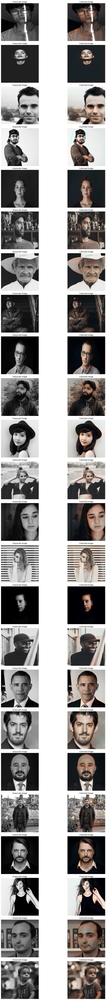

In [17]:
import cv2
import os
import numpy as np
import matplotlib.pyplot as plt
from skimage.color import rgb2lab, lab2rgb

# Path to the test dataset
testpath = '/content/drive/My Drive/col_Dataset/Test/'

# Load test images
colorize = []
test_files = [f for f in os.listdir(testpath) if os.path.isfile(os.path.join(testpath, f))]

for filename in test_files:
    img = cv2.imread(os.path.join(testpath, filename))

    # Check if image is valid
    if img is None:
        print(f"Couldn't read image {filename}. Skipping.")
        continue

    # Convert image to RGB and resize
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img_resized = cv2.resize(img, (256, 256))
    colorize.append(img_resized)

# Convert test images to LAB format and extract the L channel
colorize = np.array(colorize, dtype=float)
colorize_lab = rgb2lab(1.0 / 255 * colorize)[:, :, :, 0]
colorize_lab = colorize_lab.reshape(colorize_lab.shape + (1,))  # Add channel dimension

# Predict AB channels using the model
output = loaded_model.predict(colorize_lab)
output *= 128  # Rescale output to original LAB range

# Visualization
rows = len(colorize)
fig, ax = plt.subplots(rows, 2, figsize=(16, rows * 4))
row = 0

for i in range(rows):
    # Grayscale (L channel) image
    ax[row, 0].imshow(colorize[i] / 255, cmap='gray')
    ax[row, 0].set_title("Grayscale Image")
    ax[row, 0].axis('off')

    # Combine L channel with predicted AB channels
    cur = np.zeros((256, 256, 3))
    cur[:, :, 0] = colorize_lab[i][:, :, 0]  # L channel
    cur[:, :, 1:] = output[i]  # Predicted AB channels

    # Convert LAB to RGB for visualization
    colorized_image = lab2rgb(cur)
    ax[row, 1].imshow(colorized_image)
    ax[row, 1].set_title("Colorized Image")
    ax[row, 1].axis('off')

    row += 1

plt.tight_layout()
plt.show()


Output of the Model


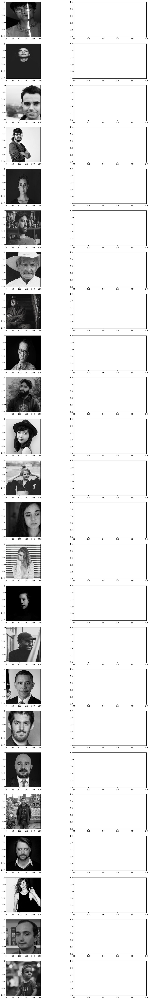

In [15]:
# fig, ax = plt.subplots(24, 2, figsize=(16, 100))
# row = 0
# colorize = []

# print('Output of the Model')

# testpath = '/content/drive/My Drive/col_Dataset/Test/'
# for filename in os.listdir(testpath):
#     img = cv2.imread(testpath + filename)

#     # Check if image is read correctly
#     if img is None:
#         print(f"Couldn't read image {filename}. Skipping.")
#         continue

#     img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
#     img_resized = cv2.resize(img, (256, 256))
#     colorize.append(img_resized)

#     ax[row, 0].imshow(cv2.cvtColor(img_resized, cv2.COLOR_BGR2RGB), interpolation='nearest')
#     row += 1

# colorize = np.array(colorize, dtype=float)
# colorize = rgb2lab(1.0/255 * colorize)[:, :, :, 0]
# colorize = colorize.reshape(colorize.shape + (1,))

In [16]:
# Test model
output = loaded_model.predict(colorize)
output *= 128

row = 0

# Output colorizations
for i in range(len(output)):
    cur = np.zeros((256, 256, 3))
    cur[:, :, 0] = colorize[i][:, :, 0]
    cur[:, :, 1:] = output[i]
    resImage = lab2rgb(cur)

    ax[row, 1].imshow(resImage, interpolation='nearest')
    row += 1


1/1 ━━━━━━━━━━━━━━━━━━━━ 12s 12s/step


<ipython-input-16-31077daeb593>:12: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 34 negative Z values that have been clipped to zero
  resImage = lab2rgb(cur)
<ipython-input-16-31077daeb593>:12: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 25 negative Z values that have been clipped to zero
  resImage = lab2rgb(cur)
<ipython-input-16-31077daeb593>:12: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 4 negative Z values that have been clipped to zero
  resImage = lab2rgb(cur)
<ipython-input-16-31077daeb593>:12: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 62 negative Z values that have been clipped to zero
  resImage = lab2rgb(cur)
